
---

**Purpose:**  
The goal is to analyze how prototypical parts in a prototype network activate for a given class.  

---

**Steps:**  
1. Select 4 random images from the test dataset.  
2. Compute the similarity scores for each prototype.  
   - Since our dataset consists of 7 classes, we used 10 prototypes for each class, resulting in a 70-length one-dimensional vector.  
3. Plot the heatmaps corresponding to their respective images and the predictions provided by the model.  

---

**Problem:**  
Work in Progress (WIP).  

---

**Dataset Used:**  
[Skin Cancer MNIST: HAM10000](https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000)  

**ProtoPNet Implementation:**  
[ProtoPNet GitHub Repository](https://github.com/cfchen-duke/ProtoPNet)  

We are happy to share the model weights or any training materials for this code. Feel free to contact us at:  
**nipun.ranasekara@um.edu.mt**

---


In [ ]:
import torch
import torch.utils.data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
import re
import os
import copy
import model

import save
from log import create_logger
from preprocess import (
    mean,
    std,
    preprocess_input_function,
    undo_preprocess_input_function,
)

import seaborn as sns
import random
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

cmap = "coolwarm"

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
class_to_idx = {"akiec": 0, "bcc": 1, "bkl": 2, "df": 3, "mel": 4, "nv": 5, "vasc": 6}

In [4]:
normalize = transforms.Normalize(mean=mean, std=std)
preprocess = transforms.Compose(
    [transforms.Resize((224, 224)), transforms.ToTensor(), normalize]
)




In [5]:
def img2Tensor(img_path, preprocess=preprocess):

    img = Image.open(img_path)
    img_tensor = preprocess(img)

    img_tensor = img_tensor.unsqueeze(0).to(device)

    return img_tensor

In [6]:
class protoPnet:

    SimScore = []
    MaxSim = None
    MinSim = None
    Model = None

    def __init__(
        self, load_model_dir: str, load_model_name: str, training_img_dir: str
    ):

        self.load_model_path = os.path.join(load_model_dir, load_model_name)

        if protoPnet.Model is None:
            protoPnet.Model = torch.load(self.load_model_path).to(device)

        self.img_size = protoPnet.Model.img_size  # 224
        prototype_shape = protoPnet.Model.prototype_shape  # 70, 128, 1, 1
        max_dist = prototype_shape[1] * prototype_shape[2] * prototype_shape[3]

        self.epoch_number_str = re.search(r"\d+", load_model_name).group(0)
        self.start_epoch_number = int(self.epoch_number_str)  # 20

        self.prototype_info = np.load(
            os.path.join(
                load_model_dir,
                "img",
                "epoch-" + self.epoch_number_str,
                "bb" + self.epoch_number_str + ".npy",
            )
        )

        self.prototype_img_identity = self.prototype_info[:, -1]

        self.prototype_max_connection = torch.argmax(
            protoPnet.Model.last_layer.weight, dim=0
        )

        self.prototype_max_connection = self.prototype_max_connection.cpu().numpy()

        if (
            np.sum(self.prototype_max_connection == self.prototype_img_identity)
            == protoPnet.Model.num_prototypes
        ):
            print("All prototypes connect most strongly to their respective classes.")
        else:
            print(
                "WARNING: Not all prototypes connect most strongly to their respective classes."
            )

        if (protoPnet.MaxSim and protoPnet.MinSim) is None:
            self.getting_MinMax(training_img_dir)

    def getting_MinMax(self, image_path: str):
        """
        This function will obtain the similarity scores for the prototypes we trained on our entire training dataset
        and then compute the minimum and maximum values for each prototype across the images:
        [num_images, num_prototypes] → [num_prototypes]

        """

        for folder in os.scandir(image_path):

            for img in os.scandir(folder.path):

                imgT = img2Tensor(img.path)

                logits, min_distances = protoPnet.Model(imgT)

                prototype_activations = protoPnet.Model.distance_2_similarity(
                    min_distances
                )

                protoPnet.SimScore.append(prototype_activations)

        scores = torch.stack(protoPnet.SimScore)  # [51176,1,70]

        scores = scores.view(
            scores.shape[0], scores.shape[1] * scores.shape[2]
        )  # [51176,70]

        protoPnet.MaxSim = torch.max(scores, dim=0).values
        protoPnet.MinSim = torch.min(scores, dim=0).values

    

In [7]:
train_img_dir = "/home/nipun/Documents/Uni_Malta/8000_train/train"

class_name = "mel"
test_img_dir = f"/home/nipun/Documents/Uni_Malta/8000_train/test/{class_name}"


load_model_dir = "saved_models/vgg19/005"
load_model_name = "20_5push0.6517.pth"




In [8]:
model = protoPnet(load_model_dir, load_model_name, train_img_dir)

All prototypes connect most strongly to their respective classes.


In [26]:
# Analyze image by image

In [105]:
pred_model = model.Model




prototype_info = model.prototype_info

prototype_img_identity = model.prototype_img_identity


prototype_max_connection = model.prototype_max_connection


prototype_class_identity = pred_model.prototype_class_identity

In [134]:
img_size = 224

In [ ]:
img = Image.open(img_paths[0])

plt.imshow(img)

In [9]:
# https://github.com/cfchen-duke/ProtoPNet
def find_high_activation_crop(activation_map, percentile=95):
    threshold = np.percentile(activation_map, percentile)
    mask = np.ones(activation_map.shape)
    mask[activation_map < threshold] = 0
    lower_y, upper_y, lower_x, upper_x = 0, 0, 0, 0
    for i in range(mask.shape[0]):
        if np.amax(mask[i]) > 0.5:
            lower_y = i
            break
    for i in reversed(range(mask.shape[0])):
        if np.amax(mask[i]) > 0.5:
            upper_y = i
            break
    for j in range(mask.shape[1]):
        if np.amax(mask[:, j]) > 0.5:
            lower_x = j
            break
    for j in reversed(range(mask.shape[1])):
        if np.amax(mask[:, j]) > 0.5:
            upper_x = j
            break
    return lower_y, upper_y + 1, lower_x, upper_x + 1

In [10]:
def findMaximumValue(activations_value):

    idx = 0

    values, indices = torch.sort(activations_value)

    return (
        values.detach().cpu().numpy()[idx][-3:],
        indices.detach().cpu().numpy()[idx][-3:],
    )

In [11]:
def find_highly_activated_regions(proto_activ_pattern, indices_of_prototypes):
    """
    This functions helps to find the higly activated regions of the image by given prototype

    """

    idx = 0

    coords = []

    for i in range(len(indices_of_prototypes)):

        activation_pattern = (
            proto_activ_pattern[idx][indices_of_prototypes[i]].detach().cpu().numpy()
        )

        upsampled_activation_pattern = cv2.resize(
            activation_pattern,
            dsize=(img_size, img_size),
            interpolation=cv2.INTER_CUBIC,
        )

        high_act_patch_indices = find_high_activation_crop(upsampled_activation_pattern)

        coords.append(high_act_patch_indices)

    return coords

In [120]:
def plot_prototypes(image_path, proto_info, indices_of_prototypes):

    # for learned prototype images
    protoPimgs = []

    # for original images which prototypes were extracted
    sourceImgs = []

    for i in range(len(indices_of_prototypes)):

        # Reading the corresponding learned prototype image with regarding the class indices
        learned_protop_img = cv2.imread(
            os.path.join(
                image_path, "prototype-img" + str(indices_of_prototypes[i]) + ".png"
            )
        )

        # Get the corresponding Original Image for above learned Prototypes

        sourceof_Protop_img = cv2.imread(
            os.path.join(
                image_path,
                "prototype-img-original" + str(indices_of_prototypes[i]) + ".png",
            )
        )

        # Extracting Coordinate
        y1 = proto_info[indices_of_prototypes[i]][1]
        y2 = proto_info[indices_of_prototypes[i]][2]

        x1 = proto_info[indices_of_prototypes[i]][3]
        x2 = proto_info[indices_of_prototypes[i]][4]

        # Draw the rectangle on the image
        cv2.rectangle(sourceof_Protop_img, (x1, y1), (x2, y2), (0, 255, 0), 1)

        protoPimgs.append(learned_protop_img)

        sourceImgs.append(sourceof_Protop_img)

    return protoPimgs, sourceImgs

In [121]:
def findMaxProtoValues(model, predicted_class, similarity_score):

    cls_identity = model.prototype_class_identity[:, predicted_class].to(device)

    # Check activations for class specific prototypes
    class_activations = similarity_score * cls_identity

    # Check  activations for all prototypes which are not belong to the predicted prototype
    non_class_activations = similarity_score * (1 - cls_identity)

    # Find Maximum 3 Activation Value from Class specic Activations
    cls_values, cls_indices = findMaximumValue(class_activations)

    # Find Maximum 3 Activation Value from Not Class specic Activations
    Ncls_values, Ncls_indices = findMaximumValue(non_class_activations)

    return (
        cls_values,
        cls_indices,
        Ncls_values,
        Ncls_indices,
        class_activations,
        non_class_activations,
    )

In [138]:
def getting_similarities_random_class(model,image_path,proto_saved_path,proto_info,num_of_samples,MinSim,MaxSim,imgVisualization=True):
    
    
    chosen_images = random.sample(os.listdir(image_path),num_of_samples)
    
    
    
    # Normalized ProtoPnet
    NormalizeActivations = []
    
    # Activation from Vanila ProtoPNet
    Activations = []
    
    
    # Locaction of images
    img_paths = []
    
    # Prediction of Each Class
    pred_labels = []
    
    
    # Prediction Class Indices
    pred_idx = []
    
    for image_file in chosen_images:
        
        image_loc = os.path.join(image_path,image_file)
                

        imgT = img2Tensor(image_loc)
        
        
        logits, min_distances = model(imgT)
        
        conv_output,distances = model.push_forward(imgT)
        
        
        prototype_activations_patterns = model.distance_2_similarity(distances)
        
        
        
        # Lets see actual classification output based on logits
        predicted_class = torch.argmax(logits,dim=1).item() 
        
        
        
        
        # Get the indices based on the predicted label
        class_prototype_indices = np.nonzero(
            model.prototype_class_identity.detach()
            .cpu()
            .numpy()[:, predicted_class]
        )

        

    
        # this is the activation score higher value indicates higher similarity
        prototype_activations = model.distance_2_similarity(min_distances)
        
        img_paths.append(image_loc)
        pred_labels.append(predicted_class)
        pred_idx.append(class_prototype_indices)
        
        
        prototype_activations = (prototype_activations - MinSim) / (
                MaxSim - MinSim
            )
        
        NormalizeActivations.append(prototype_activations)
            
        
        if imgVisualization:
            
            
            
            
            
            
            cls_values,cls_indices,Ncls_values,Ncls_indices,class_activations,non_class_activations = findMaxProtoValues(model,predicted_class,prototype_activations )
            
            
            
            Cls_prototypes,Cls_sourceimages = plot_prototypes(proto_saved_path,proto_info,cls_indices)
            
            Cls_coords = find_highly_activated_regions(prototype_activations_patterns ,cls_indices)
            
            
            
            NCls_prototypes,NCls_sourceimages = plot_prototypes(proto_saved_path,proto_info,Ncls_indices  )
            
            NCls_coords = find_highly_activated_regions(prototype_activations_patterns ,Ncls_indices)
            
            
            plotProtoInfo(model,image_loc,Cls_prototypes,Cls_sourceimages,Cls_coords,class_activations,cls_values,cls_indices,predicted_class,'Predicted Class' )
            
            plotProtoInfo(model,image_loc,NCls_prototypes,NCls_sourceimages,NCls_coords,non_class_activations,Ncls_values,Ncls_indices,predicted_class,"Except Predicted Class")
            
            
            

    
    plot_heatmaps(img_paths,NormalizeActivations,pred_labels,pred_idx) 
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
    

In [139]:
def plot_heatmaps(img_paths,normalize_activation,pred_labels,pred_idx):
    
    idx = 0
    
    
    vmin = min(act.min().item() for act in normalize_activation)
    vmax = max(act.max().item() for act in normalize_activation)
    norm = Normalize(vmin=vmin, vmax=vmax)
    
    
    fig,axs = plt.subplots(len(normalize_activation),2,dpi=150,gridspec_kw={"width_ratios": [1, 6]})
    
    
    for i in range(len(normalize_activation)):
        
        
        img = cv2.imread(img_paths[i])
        
        axs[i][0].imshow(img[:,:,::-1])
        axs[i][0].set_axis_off()
        
        axs[i][0].annotate(
                f"GT: {class_name}\nPred:{idx_to_class[pred_labels[i]]}",
                xy=(0.5, -0.4),
                xycoords="axes fraction",
                ha="center",
                fontsize=5,
            )
        
        sns.heatmap(
        normalize_activation[i].detach().cpu().numpy(),
        cmap="coolwarm",
        ax=axs[i][1],
        cbar=False,
        xticklabels=False,
        yticklabels=False)
        
        axs[i][1].set_xticks(pred_idx[i][idx])
        
        
    
    fig.subplots_adjust(right=0.85)  
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7]) 
    sm = ScalarMappable(cmap='coolwarm', norm=norm)
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label("Normalized Activation Values")

    

In [141]:
def plotProtoInfo(
    model,
    original_image_location,
    prototypes,
    sourceimages,
    coordinates,
    prototype_activations,
    sorted_values,
    indices_of_sorted_values,
    pred_class,
    specificity
):

    original_test_image = cv2.imread(original_image_location)

    

    
     
    # Creating prediction results,weight associated with last layer and activation score in prototype layer for each given prototype
    MetaProto = []
    for i in range(len(indices_of_sorted_values)):

        pred_class_of_prototype = divmod(indices_of_sorted_values[i], 10)[0]
        weight_for_prototype = model.last_layer.weight[pred_class_of_prototype][
            indices_of_sorted_values[i]
        ].item()

        details = f"Proto Class: {idx_to_class[pred_class_of_prototype]}\nActivation Score: {str(round(sorted_values[i],2))}\nWeight Value: {str(round(weight_for_prototype,2))}"

        MetaProto.append(details)

    
    # Adding prototype activations on given image  to all of the prototypes
    highly_activ_regions = []
    for coord in coordinates:

        copy_of_ori_image = original_test_image.copy()

        cv2.rectangle(
            copy_of_ori_image,
            (coord[2], coord[0]),
            (coord[3], coord[1]),
            (0, 255, 0),
            1,
        )

        highly_activ_regions.append(copy_of_ori_image)

    # Adding Prototype Images,Souce of Prototypes and Activated regions of each prototype on given image
    toll_images_to_plot = sourceimages + prototypes + highly_activ_regions

    fig = plt.figure(figsize=(8, 12), dpi=200)
    fig.suptitle(f'Analysis of Most Higly Activated Prototyes -> {specificity}')
    
    gs = fig.add_gridspec(5, 3, height_ratios=[1, 2, 2, 2, 1])
    
    
    # First Plot: Test Image
    ax_main_image = fig.add_subplot(gs[0, 1])
    ax_main_image.imshow(original_test_image[:, :, ::-1])
    ax_main_image.set_axis_off()
    ax_main_image.set_title("Test Image", fontsize=10)
    ax_main_image.annotate(
        f"Ground Truth Label: {class_name}\n Model Predictions: {idx_to_class[pred_class]}",
        xy=(0.5, -0.2),
        xycoords="axes fraction",
        ha="left",
        fontsize=8,
    )
    
    
    # Titles for given plots
    row_titles = [
        "Prototypes Source Image from the training Data",
        "Individual Prototypes",
        "Prototypes Activation Area on Test Image",
    ]

    
    # Adding 3 images for each row in this figure,it create as follows
    # Source Images ->> Rectangle is drawn where prototype was extracted
    # Prototypes --> Highly Activated Prototypes
    # Test Image Overlay of each prototype
    for i, img in enumerate(toll_images_to_plot):
        row, col = divmod(i, 3)
        ax_img = fig.add_subplot(gs[row + 1, col])
        ax_img.imshow(img[:, :, ::-1])
        ax_img.set_axis_off()

        if row == 2:

            ax_img.annotate(
                MetaProto[col],
                xy=(0.5, -0.2),
                xycoords="axes fraction",
                ha="center",
                fontsize=8,
            )

        if col == 0:
            ax_img.set_title(row_titles[row], fontsize=10, loc="center", pad=20)

    
    
    
    ax_heatmap = fig.add_subplot(gs[4, :])
    sns.heatmap(
        prototype_activations.detach().cpu().numpy(),
        cmap="coolwarm",
        ax=ax_heatmap,
        cbar=True,
        xticklabels=False,
        yticklabels=False,
    )
    ax_heatmap.set_title("Heatmap of Activations", fontsize=10)

    for i in range(len(sorted_values)):

        ax_heatmap.text(
            indices_of_sorted_values[i], 0, round(sorted_values[i], 2), size=3
        )

    ax_heatmap.set_xticks(range(10, 80, 10))
    ax_heatmap.set_xticklabels(list(class_to_idx.keys()))

    plt.tight_layout()
    plt.show()

In [142]:
pred_model = model.Model

test_img_dir = "/home/nipun/Documents/Uni_Malta/8000_train/test/df"
proto_save_path = "/home/nipun/Documents/Uni_Malta/8000_train/ProtoPNet-master/saved_models/vgg19/005/img/epoch-20"


class_name = "df"
prototype_info = model.prototype_info

idx_to_class = {value: key for key, value in class_to_idx.items()}

num_of_samples = 4

img_size = 224

max_train_score = model.MaxSim
min_train_score = model.MinSim

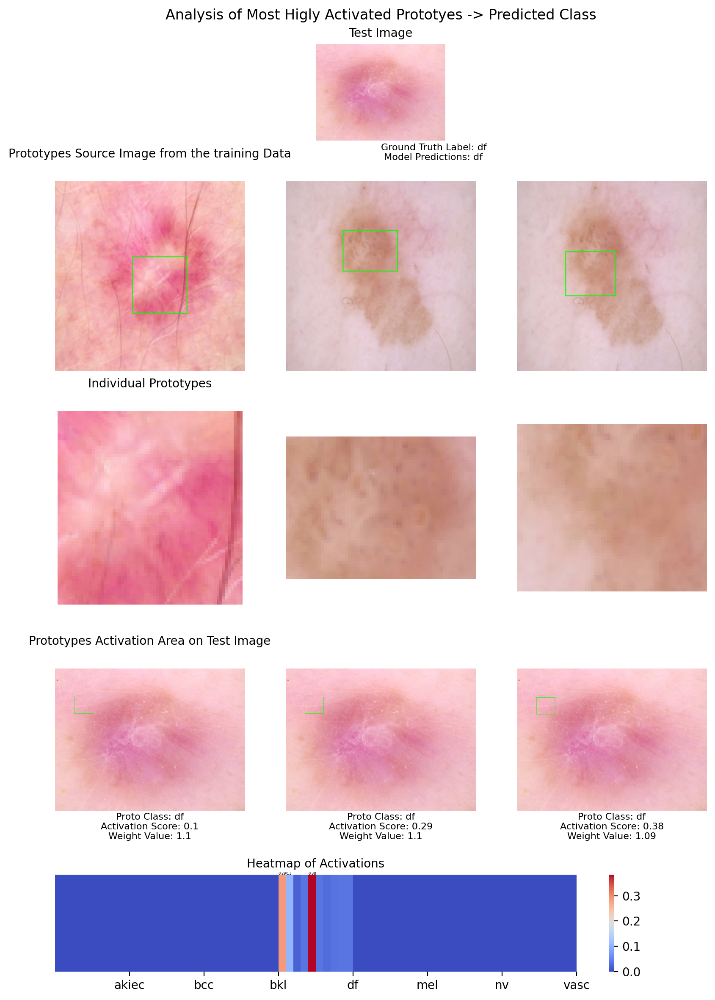

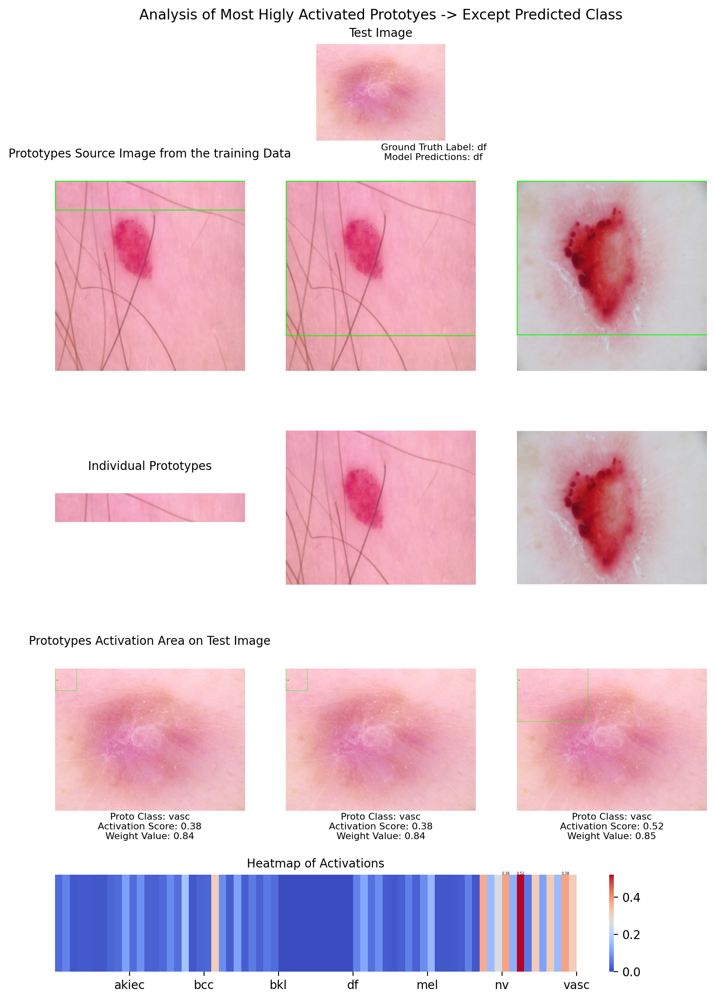

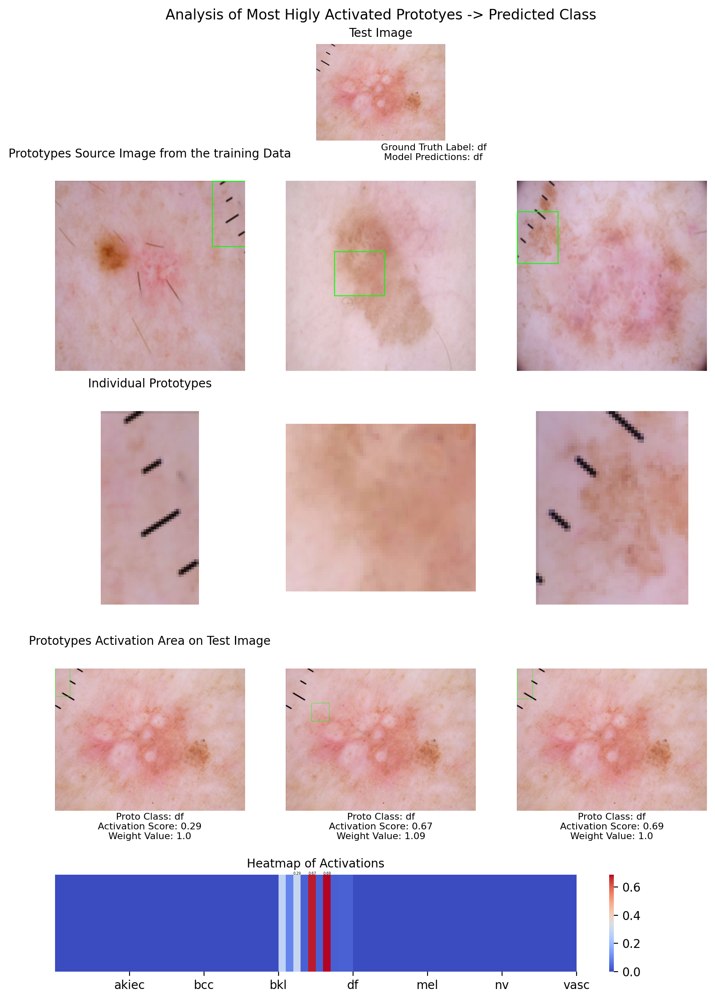

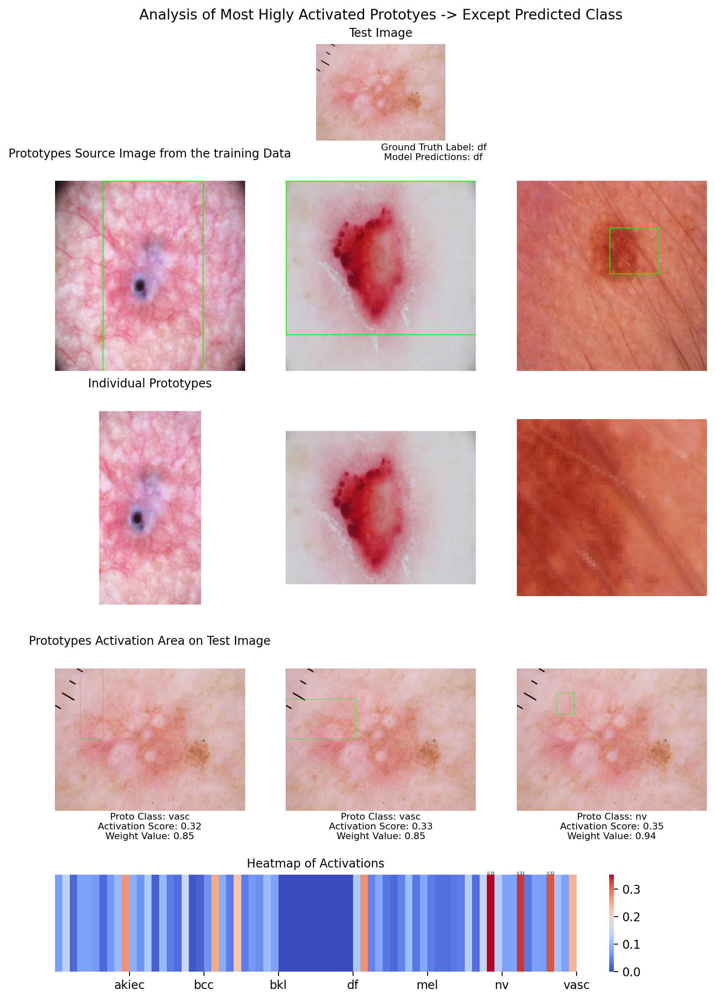

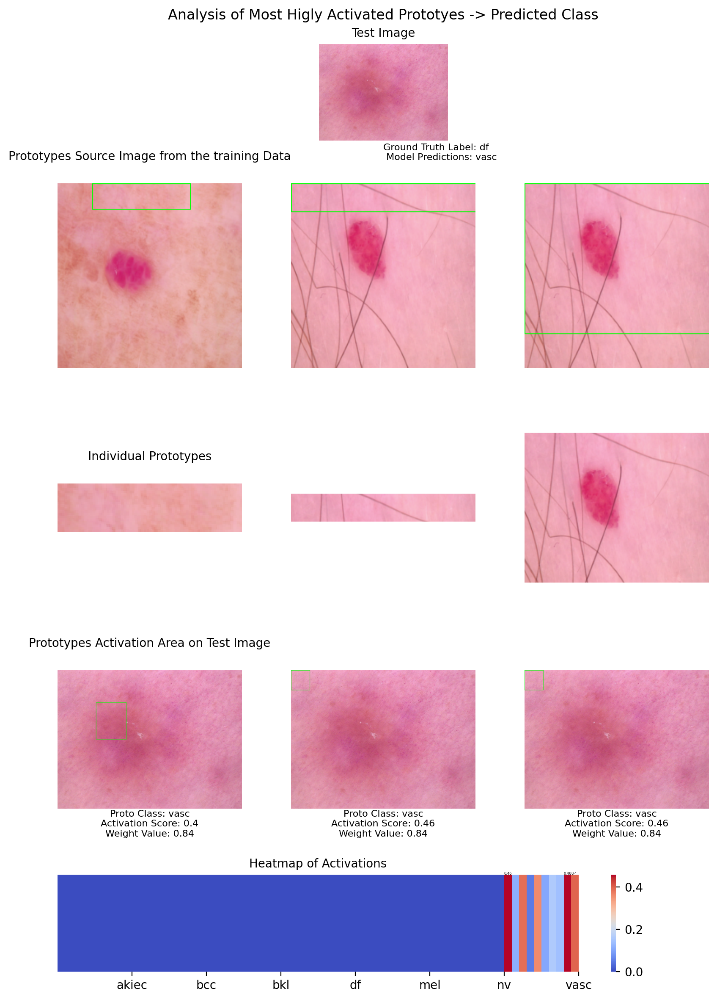

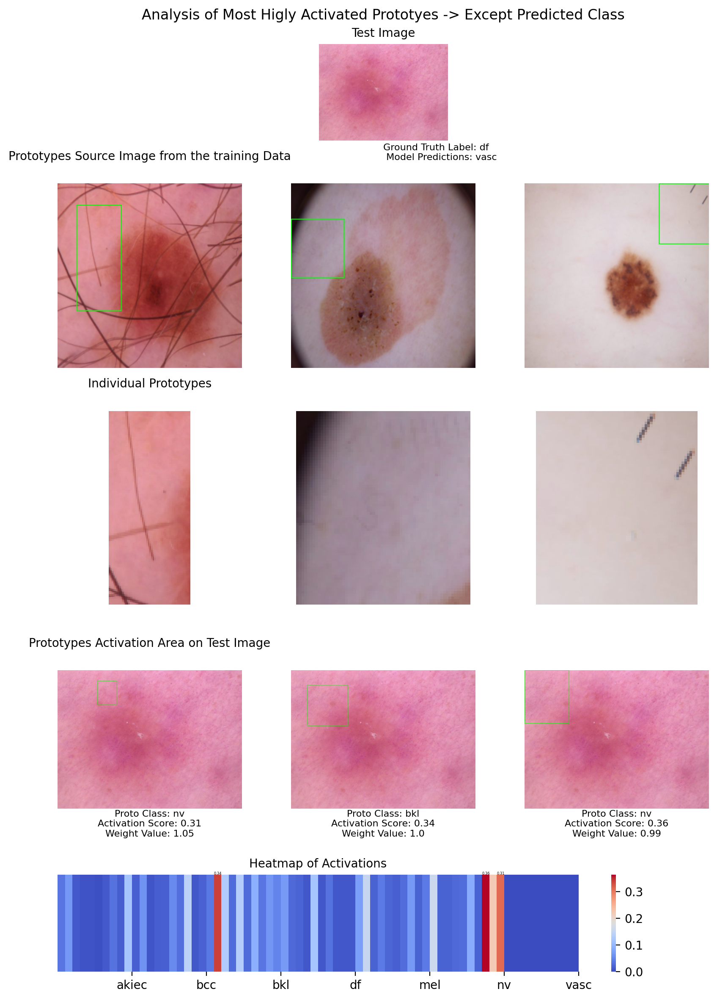

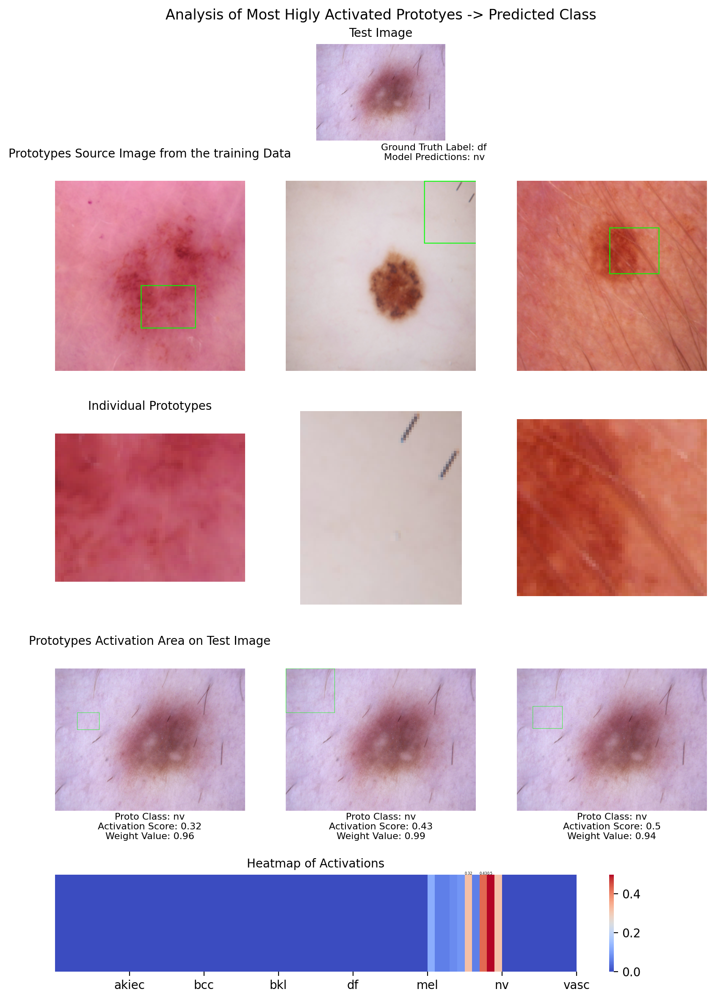

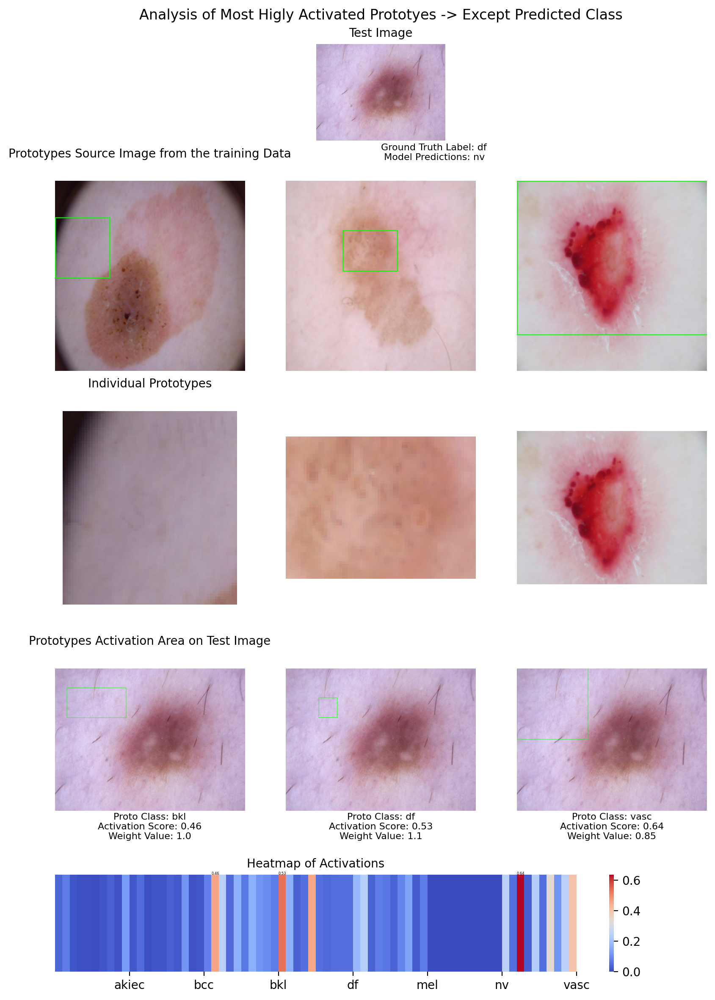

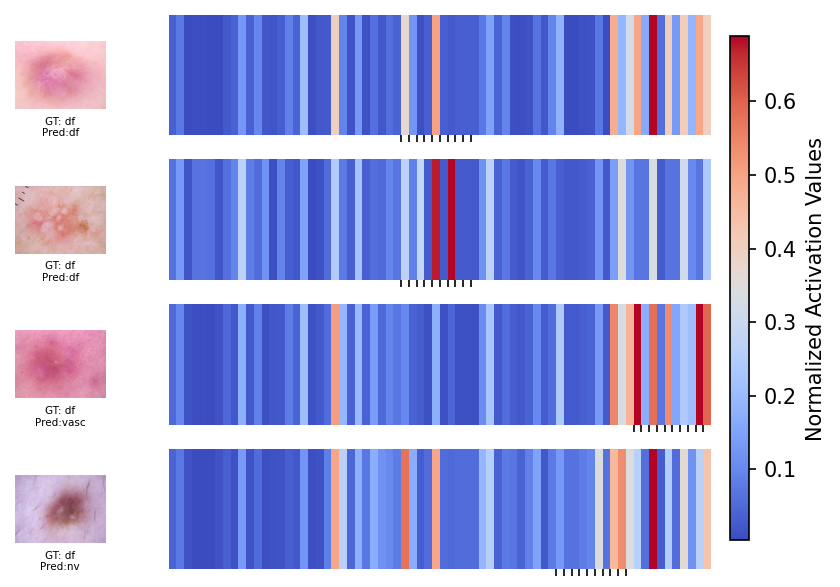

In [143]:
getting_similarities_random_class(
    pred_model, test_img_dir, proto_save_path, prototype_info,num_of_samples,min_train_score,max_train_score 
)